# Generative Adversarial Network (GAN) with Radial Mask for Image Denoising

**Objective**:
Design and implement a Generative Adversarial Network (GAN) architecture for the task of denoising images. Your GAN should be capable of reconstructing high-quality, denoised images from a dataset of noisy images that have been altered using a radial mask.

**Instructions**:

**Dataset Selection**:

Choose an image dataset of your preference. The dataset should be diverse and large enough to train a GAN effectively. You may consider well-known datasets such as CIFAR-10, CelebA, or any other dataset of your interest.<br>

**GAN Architecture**:

Design and implement a GAN architecture that consists of a generator and a discriminator.
The generator should take as input the noisy images (altered using a radial mask) and produce denoised images.
The discriminator should distinguish between the generated denoised images and the real, clean images.<br>

**Loss Functions**:

Define appropriate loss functions for both the generator and discriminator to guide the training process.
Consider using metrics such as Mean Squared Error (MSE) for image reconstruction and adversarial loss for the GAN training.<br>
**Training Procedure**:

Train your GAN using the noisy images with the radial mask applied.
Monitor the convergence of your model and adjust hyperparameters as needed.<br>
**Evaluation**:

Evaluate the performance of your GAN on a separate validation set.
Compare the denoised images generated by your model against the ground truth clean images.<br>


In [61]:
import numpy as np
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import random_split
from torch.utils.data import DataLoader
from torch.autograd import Variable
import matplotlib.pyplot as plt

from torch.utils.tensorboard import SummaryWriter
%load_ext tensorboard

plt.style.use('dark_background')

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [62]:
def denormalize(img, mean, std):
  return img * mean + std

In [63]:
def createRadialMask(image, num_spokes=50, rings=500):
    # Define the size of the k-space matrix
    matrix_size_x = image.shape[1]
    matrix_size_y = image.shape[0]

    # Create an empty mask
    radialMask = np.zeros((matrix_size_y, matrix_size_x))

    # Define the center of k-space
    center_x = matrix_size_x // 2
    center_y = matrix_size_y // 2


    for r in range(rings):
        # Define the maximum radius to sample
        max_radius = abs(min(center_x, center_y) - r)
        # Generate the radial sampling mask
        for i in range(num_spokes):
            angle = 2 * np.pi * i / num_spokes

            # Calculate scaled coordinates within the valid range
            x = int(center_x + max_radius * np.cos(angle))
            y = int(center_y + max_radius * np.sin(angle))

            # Ensure coordinates are within bounds
            x = max(0, min(matrix_size_x - 1, x))
            y = max(0, min(matrix_size_y - 1, y))
            radialMask[y, x] = 1

    return radialMask

In [64]:
mean = 0.5
std = 0.5

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([mean]*3, [std]*3),
])

train = datasets.CIFAR10(root="./data", train=True, download=True, transform=transform)
test = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

Files already downloaded and verified
Files already downloaded and verified


## Visualization

In [65]:
previewloader = DataLoader(train, batch_size=1)

In [66]:
image, _ = next(iter(previewloader))
image_array = denormalize(image[0].permute(1,2,0).numpy(), mean, std)

In [67]:
mask = createRadialMask(image_array)
mask.shape

(32, 32)

In [68]:
masked_image_array = image_array * mask[:,:,np.newaxis]

In [69]:
# My proud experiment to figure out how I would create the noised images in training :)
# Alternatively, I could also make a custom dataset class to return real & masked images
t = np.repeat(mask[np.newaxis, :, :, np.newaxis], axis=0, repeats=3)
print(np.all(np.equal(t[0], t[1])))
print(t.shape)

True
(3, 32, 32, 1)


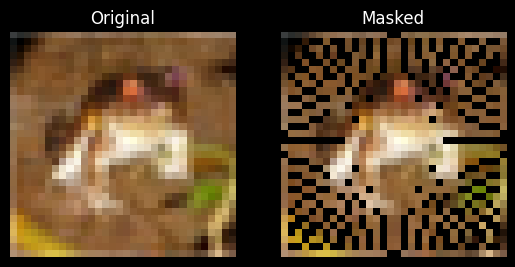

In [70]:
plt.subplot(1, 2, 1)
plt.imshow(image_array)
plt.axis('off')
plt.title('Original')


plt.subplot(1, 2, 2)
plt.imshow(masked_image_array)
plt.axis('off')
plt.title('Masked')

plt.show()

## Setting up the data

In [71]:
# val_size = 5000
# train_size = len(train) - val_size

# # Randomly split the dataset into training and validation datasets
# train_dataset, val_dataset = random_split(train, [train_size, val_size])

# # Print the sizes of the datasets to verify the split
# print(f"Size of new training set: {len(train_dataset)}")
# print(f"Size of validation set: {len(val_dataset)}")

In [83]:
batch_size = 64

loader = {
    'train': DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=2),
    # 'val': DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2),
    'test': DataLoader(test, batch_size=batch_size, shuffle=False, num_workers=2)
}

dataset_sizes = {
    'train': len(train),
    # 'val': val_size,
    'test': len(test)
}
dataset_sizes

{'train': 50000, 'test': 10000}

# GAN Implemntation

In [73]:
import torch
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
            nn.ReLU(True),

            nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 1, 4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)

## Hyperparamters & Configuration

In [74]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
lr = 3e-4
epochs = 25
beta1, beta2 = 0.5, 0.999

# Training

In [75]:
netG = Generator().to(device)
netD = Discriminator().to(device)

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, beta2))

mse_loss = nn.MSELoss()
criterion = nn.BCELoss()

writer = SummaryWriter('runs/GAN_experiment')
step = 0

In [76]:
fixed_batch, _ = next(iter(loader['train']))
fixed_batch = fixed_batch.to(device)
fixed_mask = torch.from_numpy(
    np.repeat(mask[np.newaxis, :, :, np.newaxis], axis=0, repeats=fixed_batch.size(0))
).permute(0, 3, 1, 2).float().to(device)
fixed_noised_img = fixed_batch * fixed_mask

In [77]:
for epoch in range(epochs):
    for i, data in enumerate(loader['train'], 0):
        netD.zero_grad()
        real, _ = data
        real = real.to(device)
        batch_size = real.size(0)


        # Update Discriminator: max log(D(X)) + log(1 - D(G(z)))
        labels = torch.full((batch_size,), 1, dtype=torch.float).to(device)
        output = netD(real)
        errD_real = criterion(output, labels)
        errD_real.backward()

        batch_mask = torch.from_numpy(
            np.repeat(mask[np.newaxis, :, :, np.newaxis], axis=0, repeats=batch_size)
            ).permute(0, 3, 1, 2).float().to(device)
        noised_img = real * batch_mask
        fake = netG(noised_img)
        labels.fill_(0)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        errD = errD_real + errD_fake
        optimizerD.step()


        # Update Generator: max log(D(G(z)))
        netG.zero_grad()
        labels.fill_(1)
        output = netD(fake)

        errG_adv = criterion(output, labels)
        errG_mse = mse_loss(fake, real)
        errG = errG_adv + errG_mse

        errG.backward()
        optimizerG.step()


        if i % 50 == 0:
            print(
                 f"Epoch [{epoch}/{epochs}] Batch {i}/{len(loader['train'])} \
                  Loss D: {errD:.4f}, loss G: {errG:.4f}"
            )

            with torch.no_grad():
                # Denoise the fixed noised images
                denoised_images = netG(fixed_noised_img)

                # Make grids from original, noisy, and denoised images
                img_grid_original = torchvision.utils.make_grid(fixed_batch[:32], normalize=True)
                img_grid_noisy = torchvision.utils.make_grid(fixed_noised_img[:32], normalize=True)
                img_grid_denoised = torchvision.utils.make_grid(denoised_images[:32], normalize=True)

                # Write to tensorboard
                writer.add_image('Original Images', img_grid_original, global_step=epoch * len(loader['train']) + i)
                writer.add_image('Noisy Images', img_grid_noisy, global_step=epoch * len(loader['train']) + i)
                writer.add_image('Denoised Images', img_grid_denoised, global_step=epoch * len(loader['train']) + i)
                writer.add_scalar('Loss/Discriminator', errD, epoch * len(loader['train']) + i)
                writer.add_scalar('Loss/Generator', errG, epoch * len(loader['train']) + i)


    # Checkpoint generator model after each epoch
    torch.save(netG.state_dict(), f'generator_epoch_{epoch}.pth')

Epoch [0/25] Batch 0/782                   Loss D: 1.4097, loss G: 2.8118
Epoch [0/25] Batch 50/782                   Loss D: 0.9619, loss G: 3.7534
Epoch [0/25] Batch 100/782                   Loss D: 1.0805, loss G: 2.4250
Epoch [0/25] Batch 150/782                   Loss D: 1.0629, loss G: 1.7744
Epoch [0/25] Batch 200/782                   Loss D: 0.9980, loss G: 2.5885
Epoch [0/25] Batch 250/782                   Loss D: 1.0597, loss G: 3.5237
Epoch [0/25] Batch 300/782                   Loss D: 0.8264, loss G: 4.1635
Epoch [0/25] Batch 350/782                   Loss D: 0.7589, loss G: 3.7475
Epoch [0/25] Batch 400/782                   Loss D: 1.0974, loss G: 2.0449
Epoch [0/25] Batch 450/782                   Loss D: 0.9248, loss G: 3.0770
Epoch [0/25] Batch 500/782                   Loss D: 0.5086, loss G: 2.8149
Epoch [0/25] Batch 550/782                   Loss D: 1.0438, loss G: 1.7022
Epoch [0/25] Batch 600/782                   Loss D: 0.8357, loss G: 3.9989
Epoch [0/25] Ba

## Visualizing training generations & graphs

In [78]:
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Testing

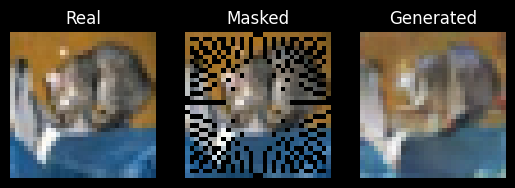

In [94]:
def visualize_images(real, generated):
  generated = denormalize(
                generated[0].permute(1,2,0).detach().cpu().numpy(),
                mean,
                std
              )
  real = denormalize(
          real[0].permute(1,2,0).detach().cpu().numpy(),
          mean,
          std
        )
  masked = real * mask[:,:,np.newaxis]

  plt.subplot(1,3,1)
  plt.imshow(real)
  plt.title("Real")
  plt.axis('off')

  plt.subplot(1,3,2)
  plt.imshow(masked)
  plt.title("Masked")
  plt.axis('off')

  plt.subplot(1,3,3)
  plt.imshow(generated)
  plt.title("Generated")
  plt.axis('off')

  plt.show()


real, _ = next(iter(loader['test']))
real = real.to(device)
generated = netG(real)

visualize_images(real, generated)

MSE error: 0.0819


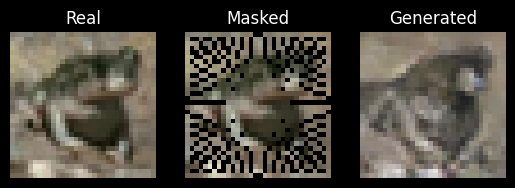

MSE error: 0.0529


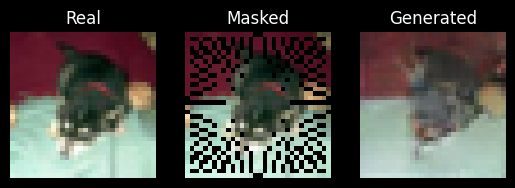

MSE error: 0.0744


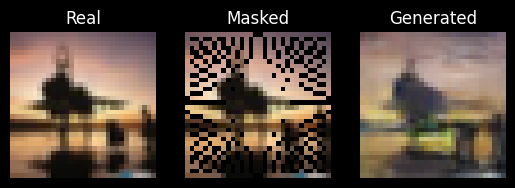

MSE error: 0.0617


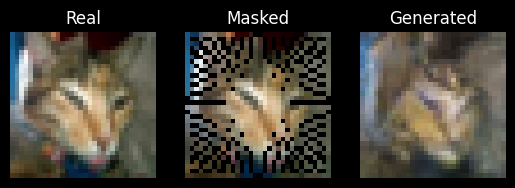

MSE error: 0.0681


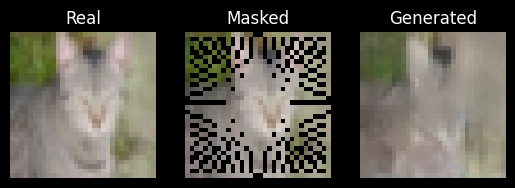

MSE error: 0.0582


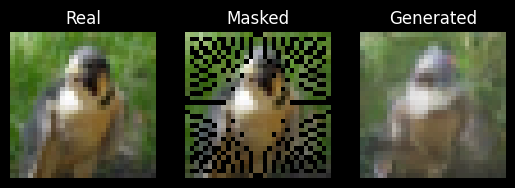

MSE error: 0.0500


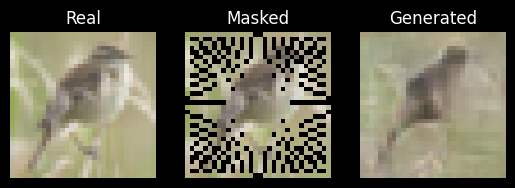

MSE error: 0.0674


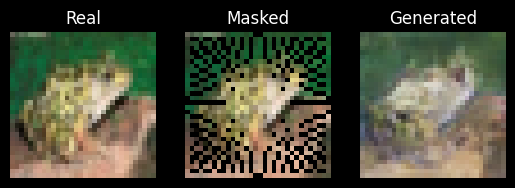

MSE error: 0.0674


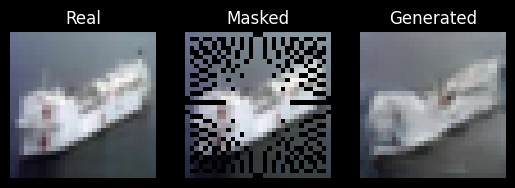

MSE error: 0.0541


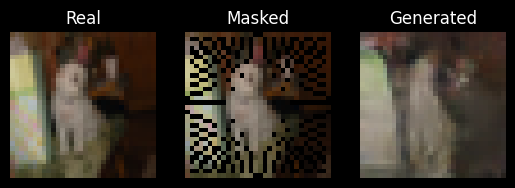

MSE error: 0.0548


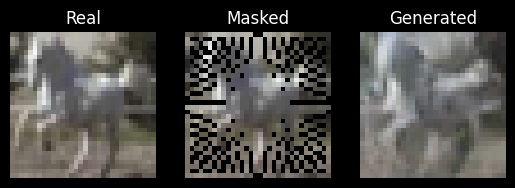

MSE error: 0.0547


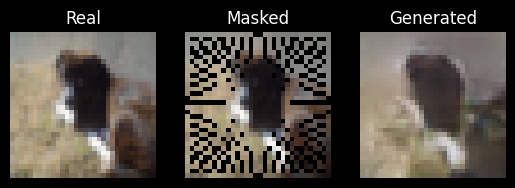

MSE error: 0.0573


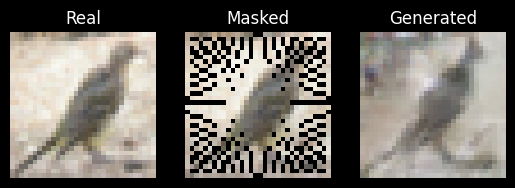

MSE error: 0.0520


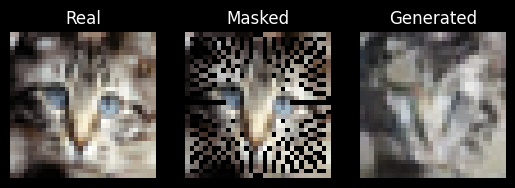

MSE error: 0.0566


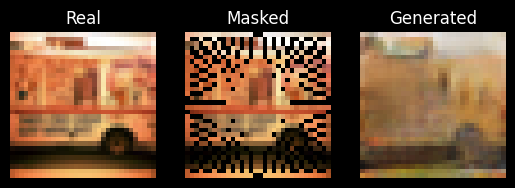

MSE error: 0.0674


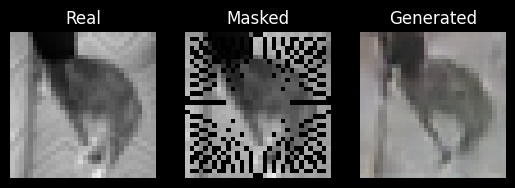

MSE error: 0.0498


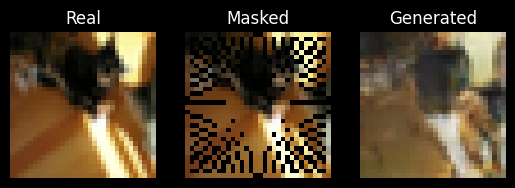

MSE error: 0.0626


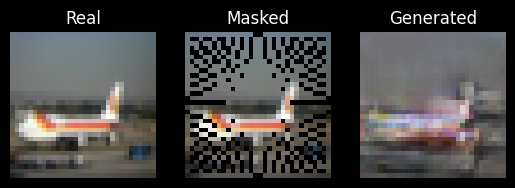

MSE error: 0.0628


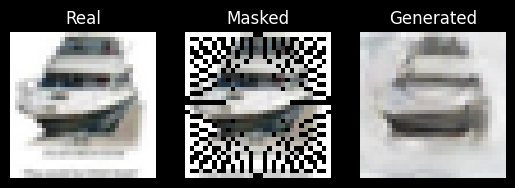

MSE error: 0.0647


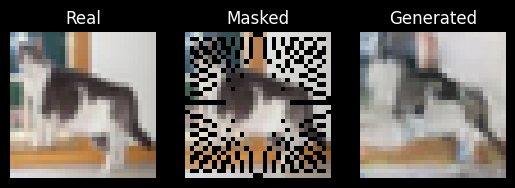

MSE error: 0.0546


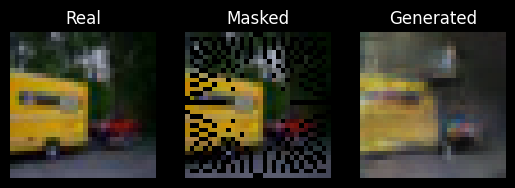

MSE error: 0.0565


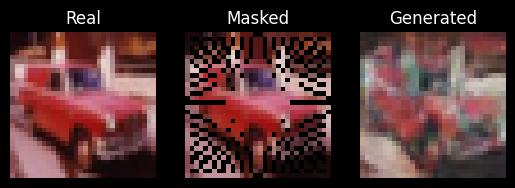

MSE error: 0.0604


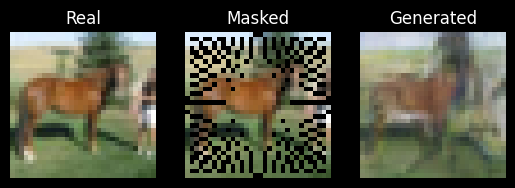

MSE error: 0.0570


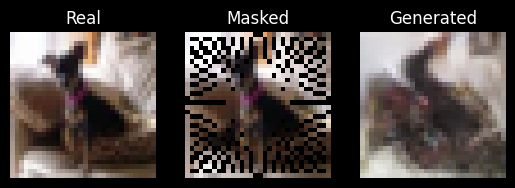

MSE error: 0.0655


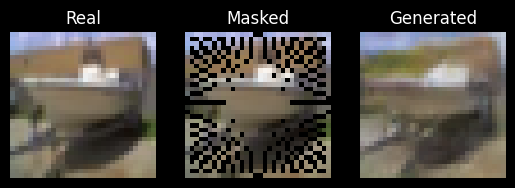

MSE error: 0.0709


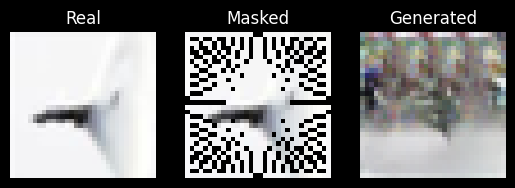

MSE error: 0.0730


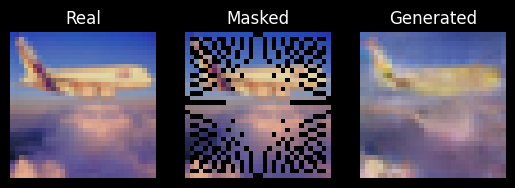

MSE error: 0.0653


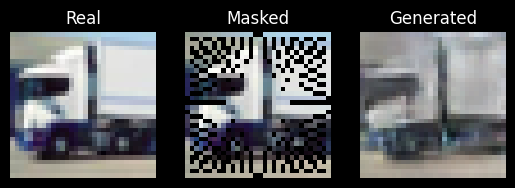

MSE error: 0.0680


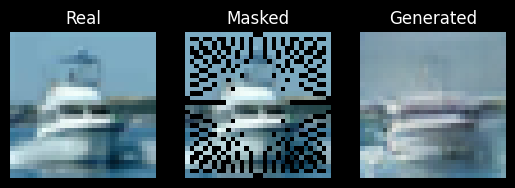

MSE error: 0.0510


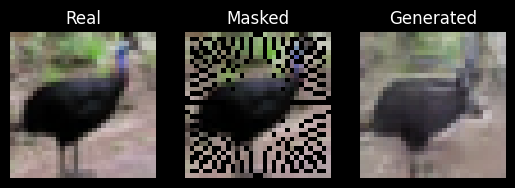

MSE error: 0.0552


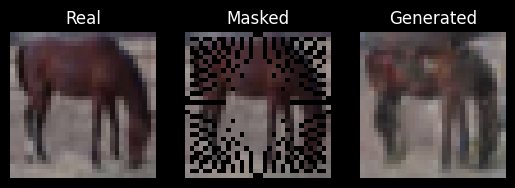

MSE error: 0.0534


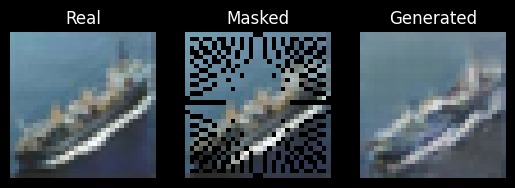

MSE error: 0.0537


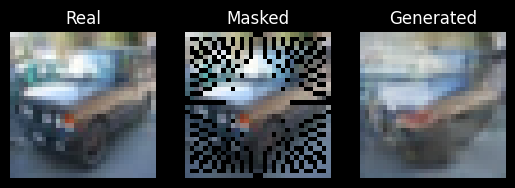

MSE error: 0.0612


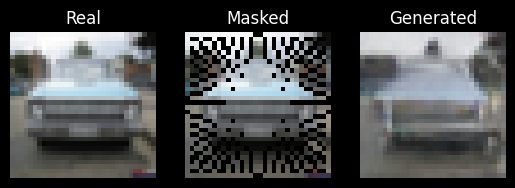

MSE error: 0.0533


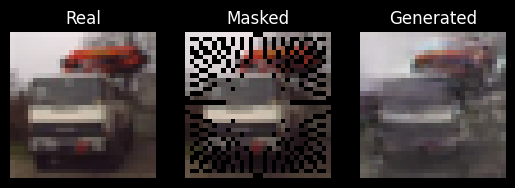

MSE error: 0.0603


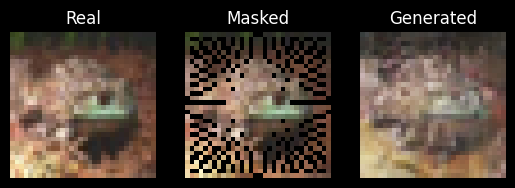

MSE error: 0.0573


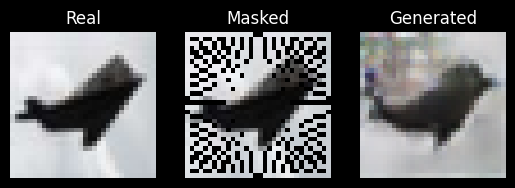

MSE error: 0.0646


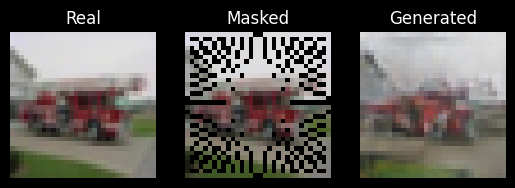

MSE error: 0.0606


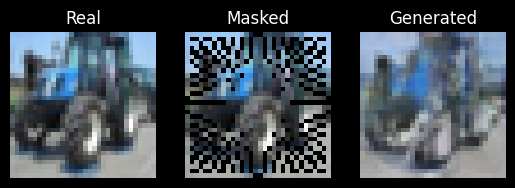

MSE error: 0.0428


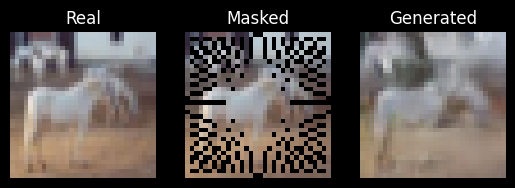

MSE error: 0.0551


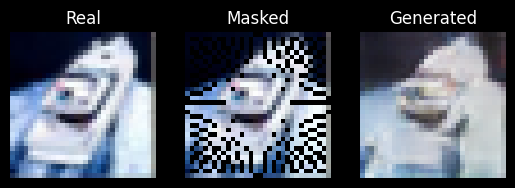

MSE error: 0.0693


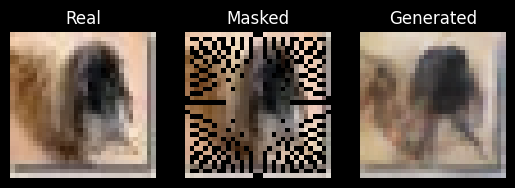

MSE error: 0.0669


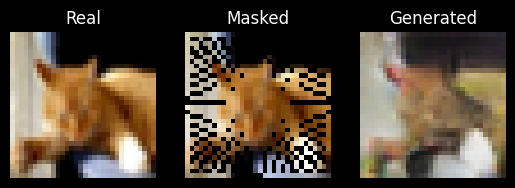

MSE error: 0.0585


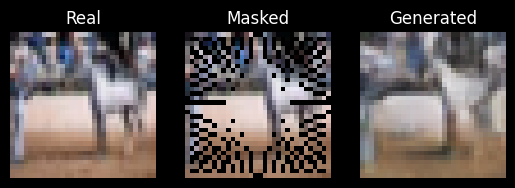

MSE error: 0.0579


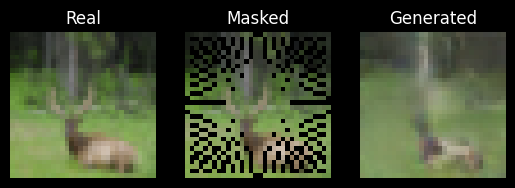

MSE error: 0.0540


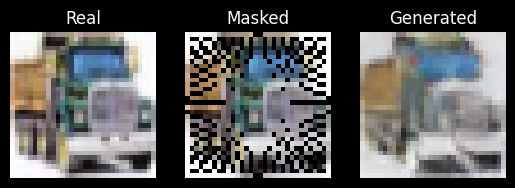

MSE error: 0.0603


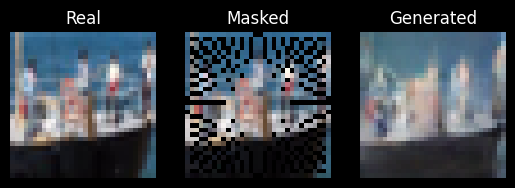

MSE error: 0.0630


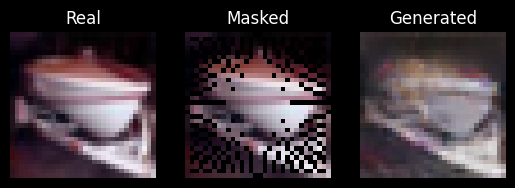

MSE error: 0.0608


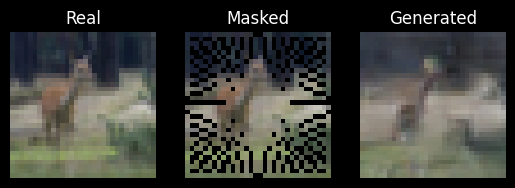

MSE error: 0.0494


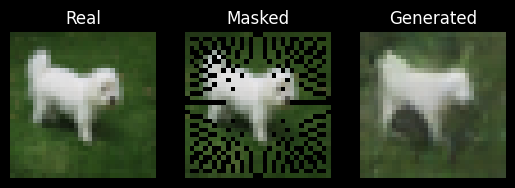

MSE error: 0.0543


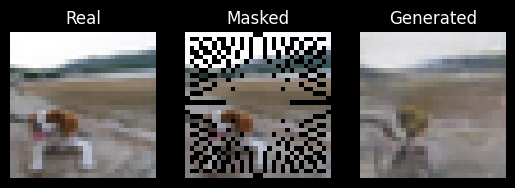

MSE error: 0.0552


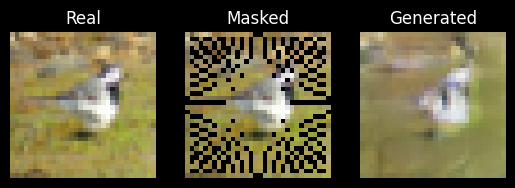

MSE error: 0.0664


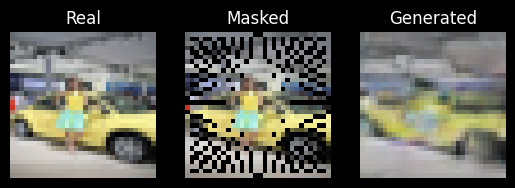

MSE error: 0.0544


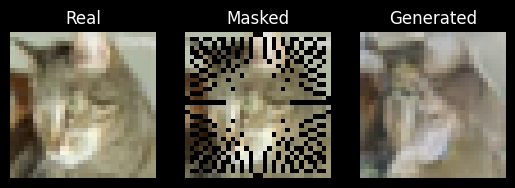

MSE error: 0.0627


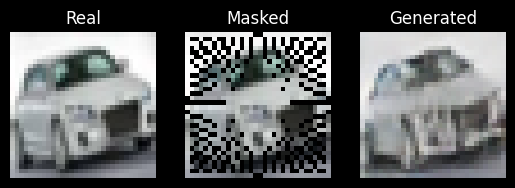

MSE error: 0.0657


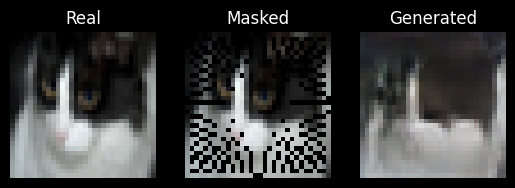

MSE error: 0.0479


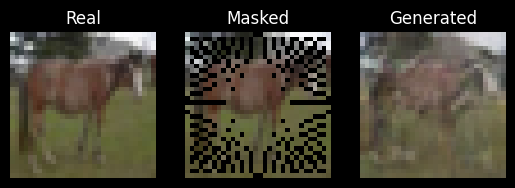

MSE error: 0.0675


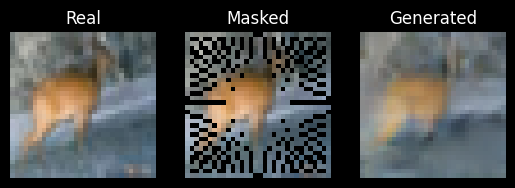

MSE error: 0.0625


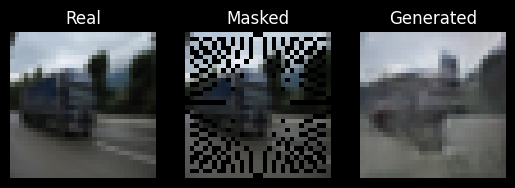

MSE error: 0.0553


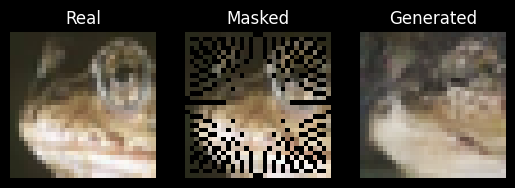

MSE error: 0.0510


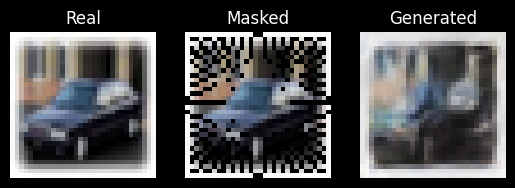

MSE error: 0.0473


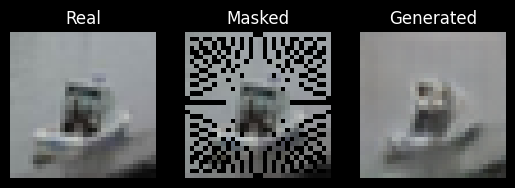

MSE error: 0.0531


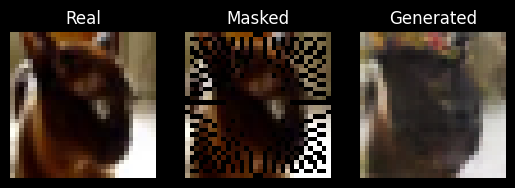

MSE error: 0.0585


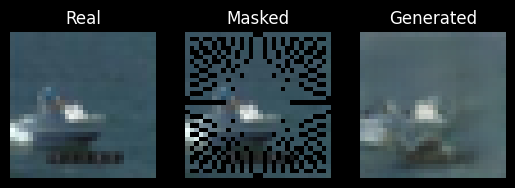

MSE error: 0.0516


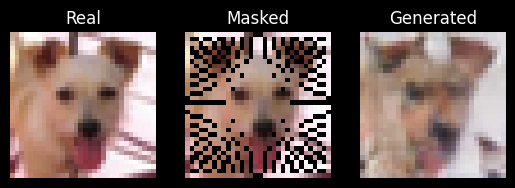

MSE error: 0.0668


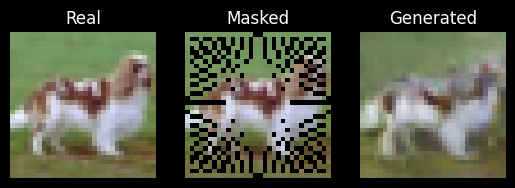

MSE error: 0.0663


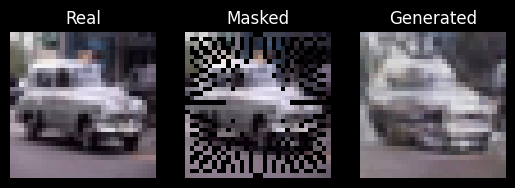

MSE error: 0.0605


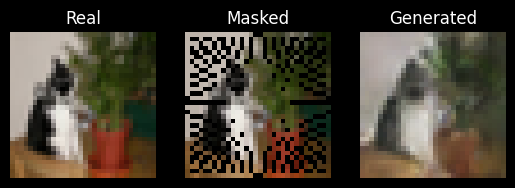

MSE error: 0.0742


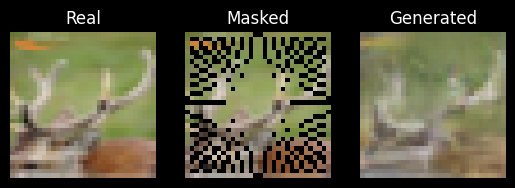

MSE error: 0.0592


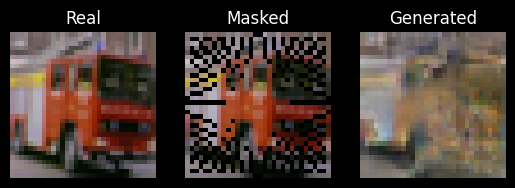

MSE error: 0.0607


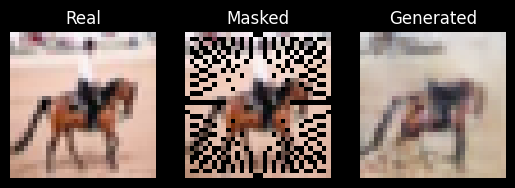

MSE error: 0.0562


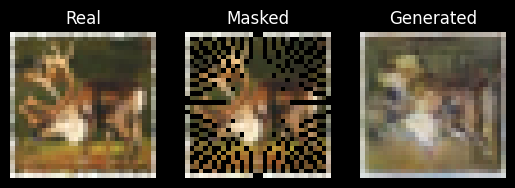

MSE error: 0.0621


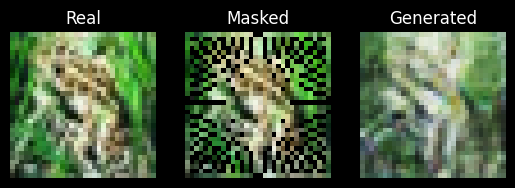

MSE error: 0.0691


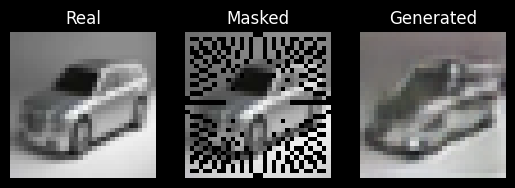

MSE error: 0.0597


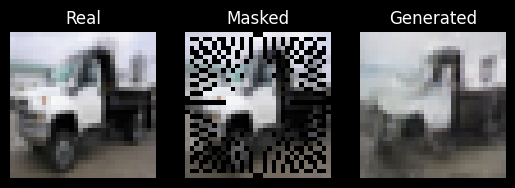

MSE error: 0.0610


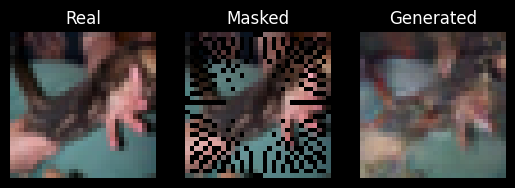

MSE error: 0.0535


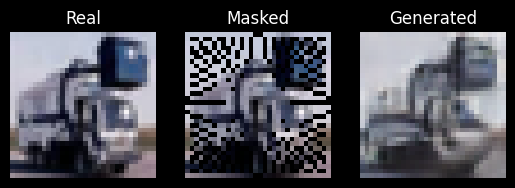

MSE error: 0.0515


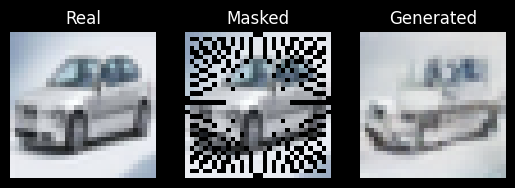

MSE error: 0.0531


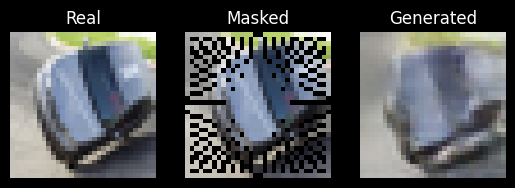

MSE error: 0.0620


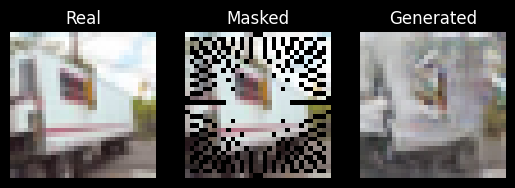

MSE error: 0.0763


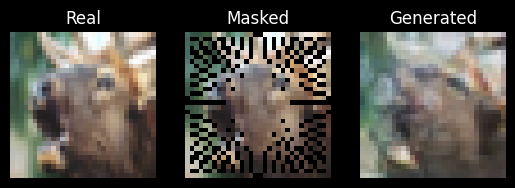

MSE error: 0.0609


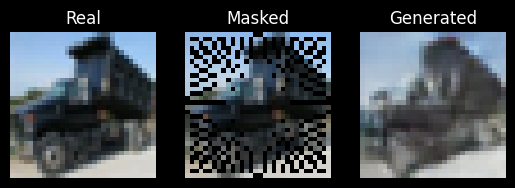

MSE error: 0.0532


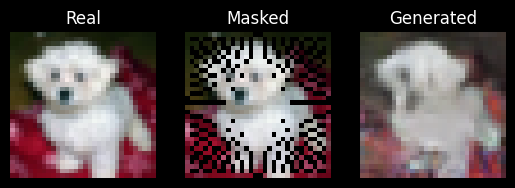

MSE error: 0.0531


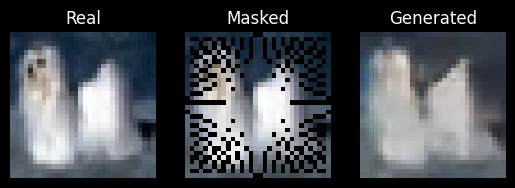

MSE error: 0.0688


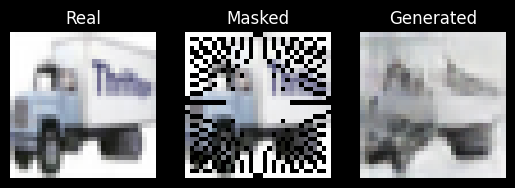

MSE error: 0.0514


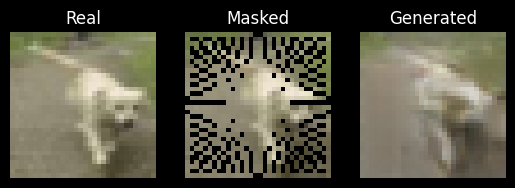

MSE error: 0.0731


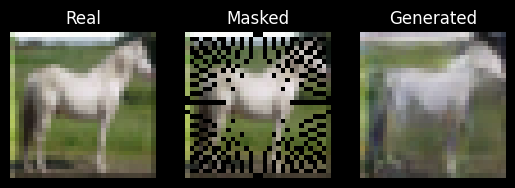

MSE error: 0.0477


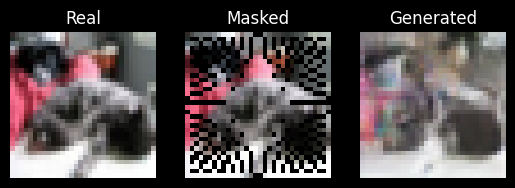

MSE error: 0.0585


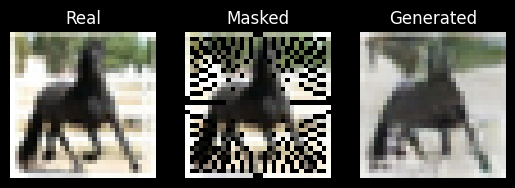

MSE error: 0.0543


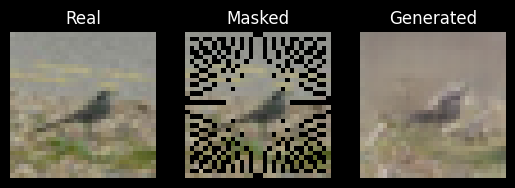

MSE error: 0.0487


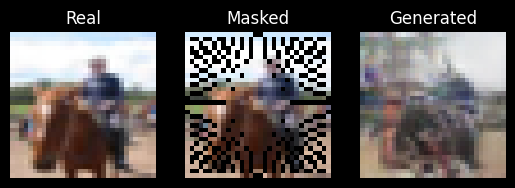

MSE error: 0.0529


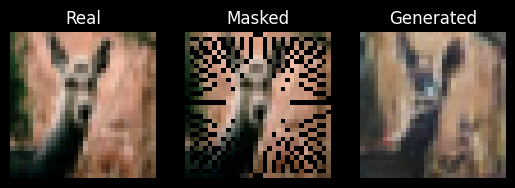

MSE error: 0.0674


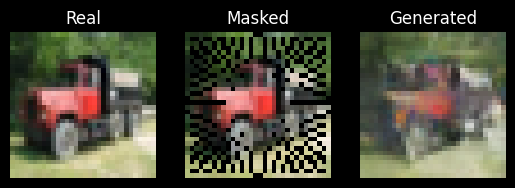

MSE error: 0.0508


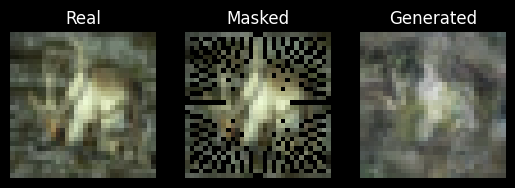

MSE error: 0.0600


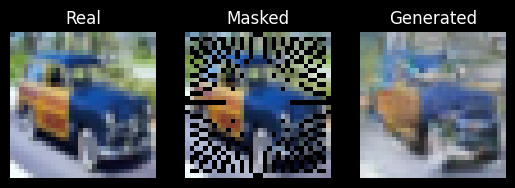

MSE error: 0.0528


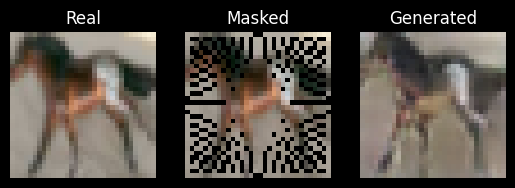

MSE error: 0.0507


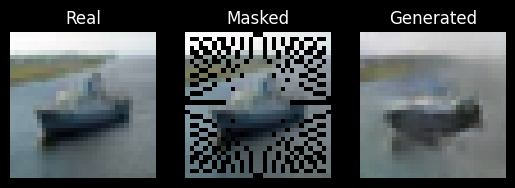

MSE error: 0.0580


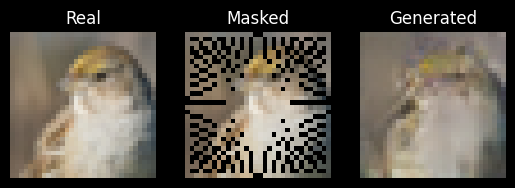

MSE error: 0.0588


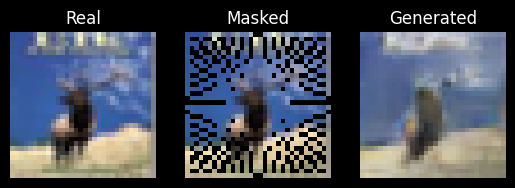

MSE error: 0.0650


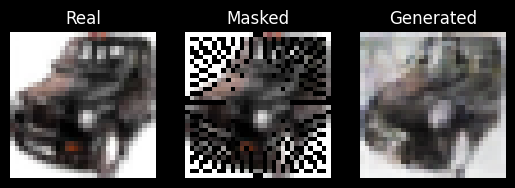

MSE error: 0.0573


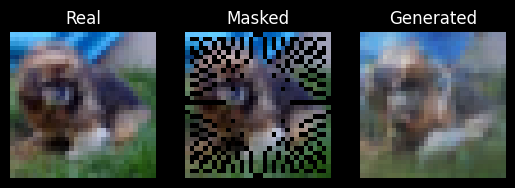

MSE error: 0.0545


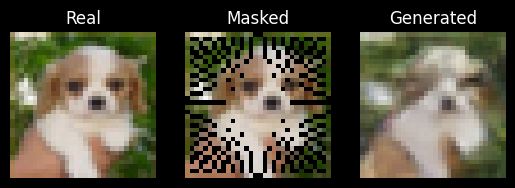

MSE error: 0.0556


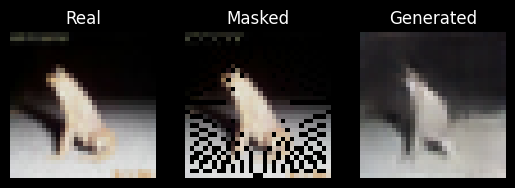

MSE error: 0.0526


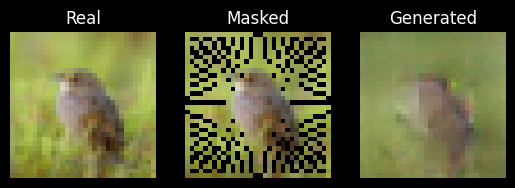

MSE error: 0.0502


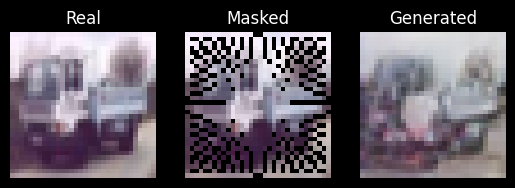

MSE error: 0.0597


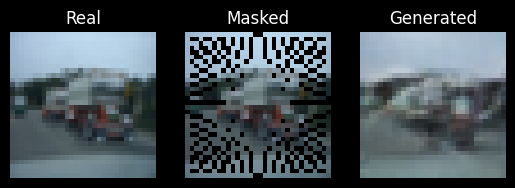

MSE error: 0.0598


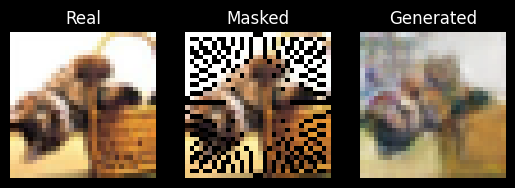

MSE error: 0.0553


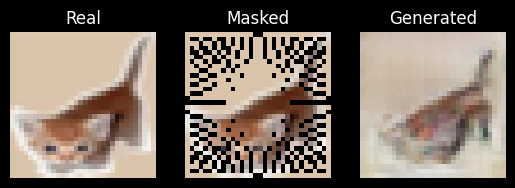

MSE error: 0.0615


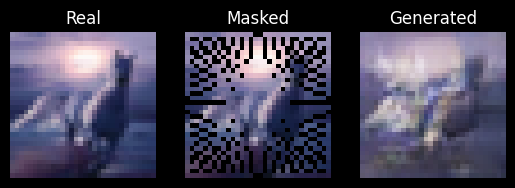

MSE error: 0.0666


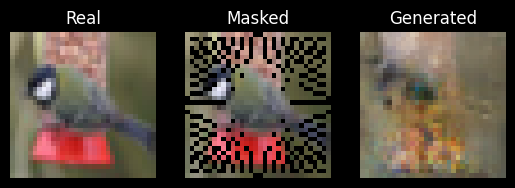

MSE error: 0.0655


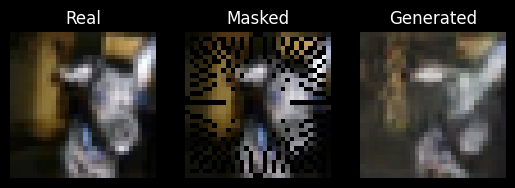

MSE error: 0.0586


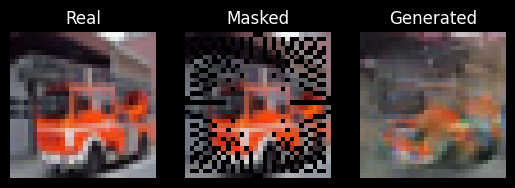

MSE error: 0.0467


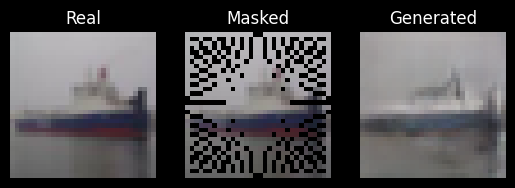

MSE error: 0.0570


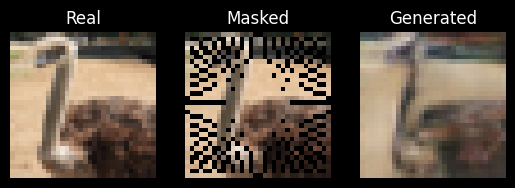

MSE error: 0.0671


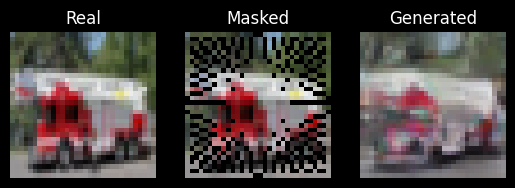

MSE error: 0.0604


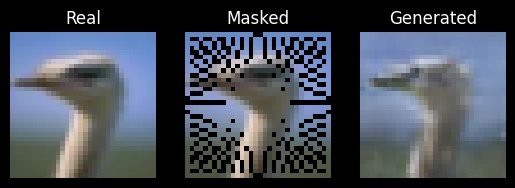

MSE error: 0.0524


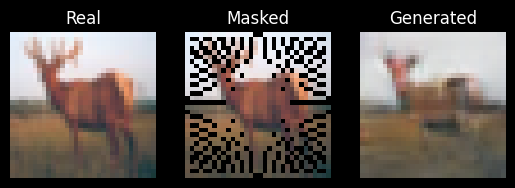

MSE error: 0.0585


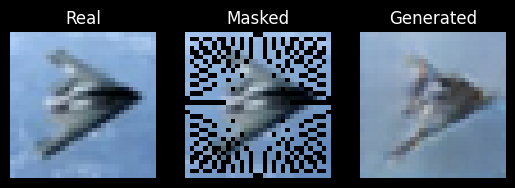

MSE error: 0.0581


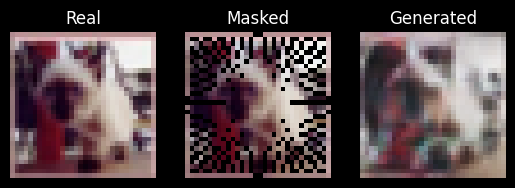

MSE error: 0.0690


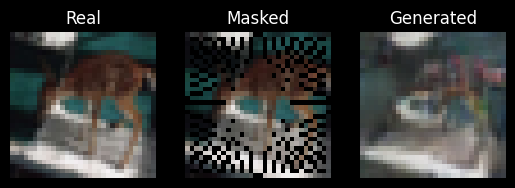

MSE error: 0.0599


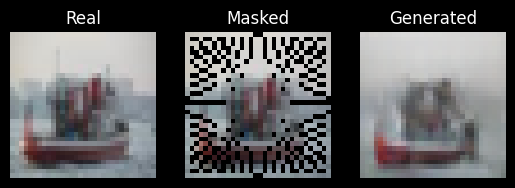

MSE error: 0.0703


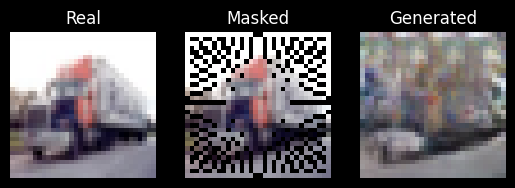

MSE error: 0.0550


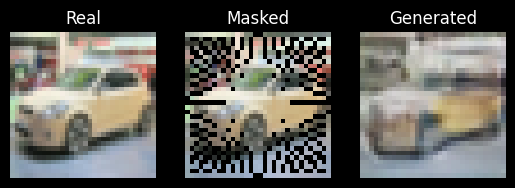

MSE error: 0.0697


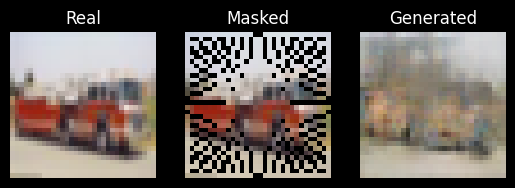

MSE error: 0.0563


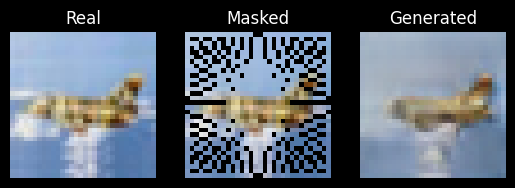

MSE error: 0.0493


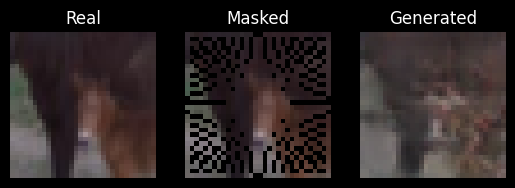

MSE error: 0.0649


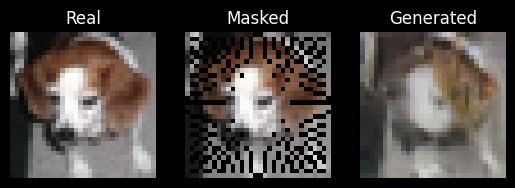

MSE error: 0.0504


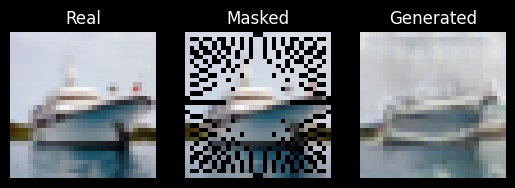

MSE error: 0.0618


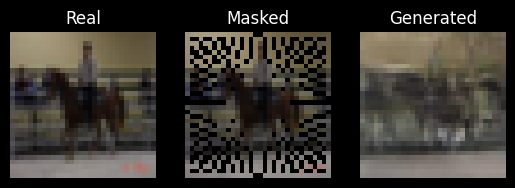

MSE error: 0.0491


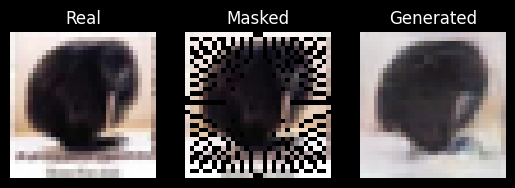

MSE error: 0.0661


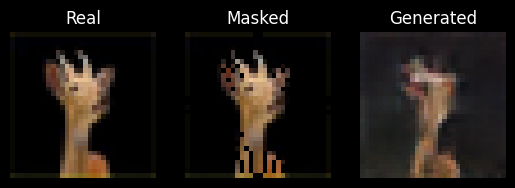

MSE error: 0.0680


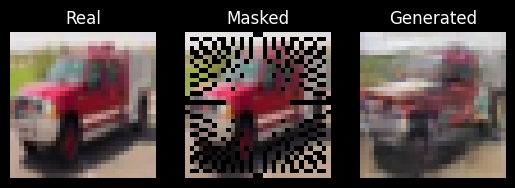

MSE error: 0.0587


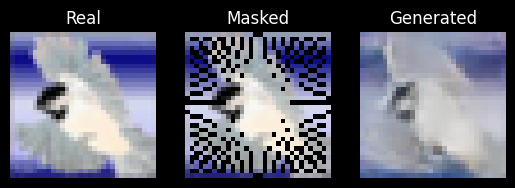

MSE error: 0.0526


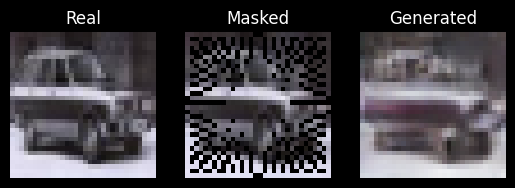

MSE error: 0.0513


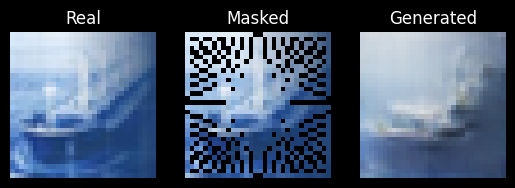

MSE error: 0.0590


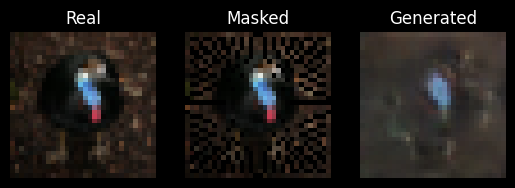

MSE error: 0.0557


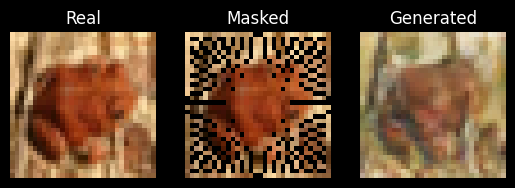

MSE error: 0.0693


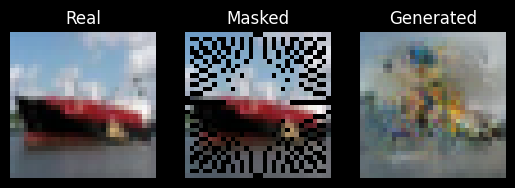

MSE error: 0.0671


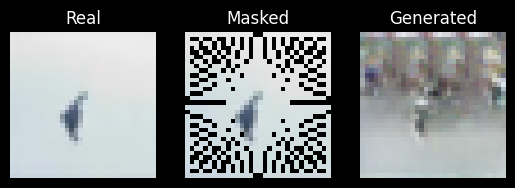

MSE error: 0.0579


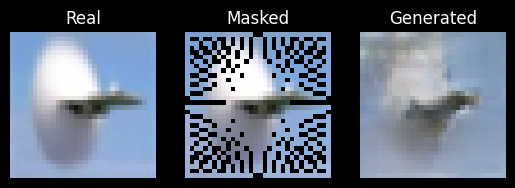

MSE error: 0.0438


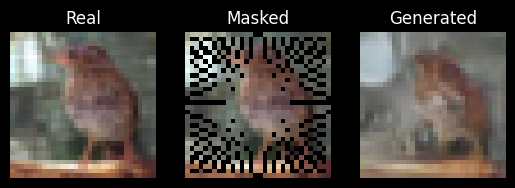

MSE error: 0.0618


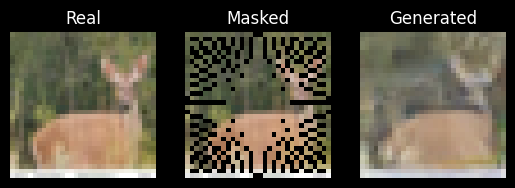

MSE error: 0.0590


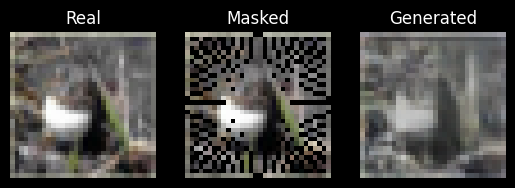

MSE error: 0.0463


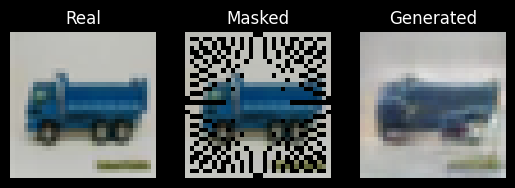

MSE error: 0.0531


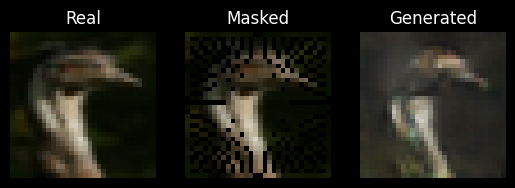

MSE error: 0.0517


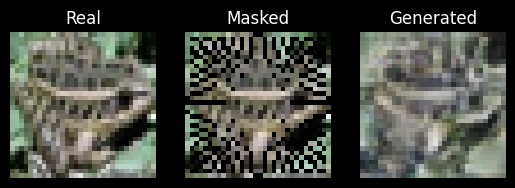

MSE error: 0.0596


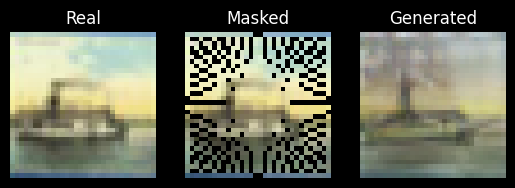

MSE error: 0.0615


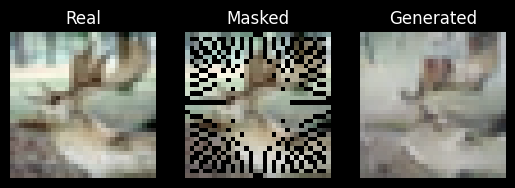

MSE error: 0.0625


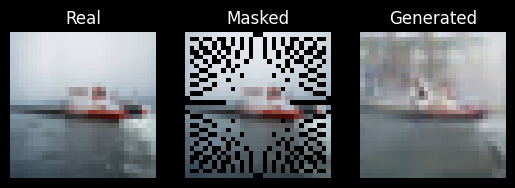

MSE error: 0.0582


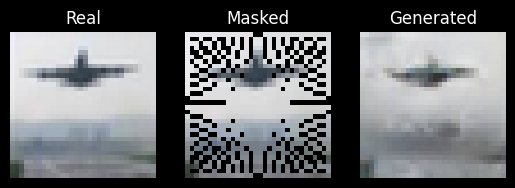

MSE error: 0.0570


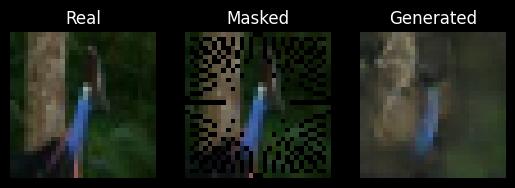

MSE error: 0.0578


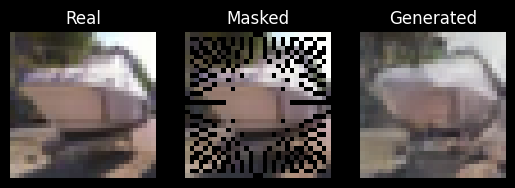

MSE error: 0.0534


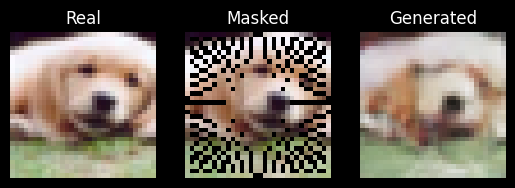

MSE error: 0.0623


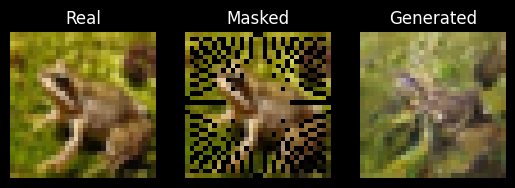

MSE error: 0.0519


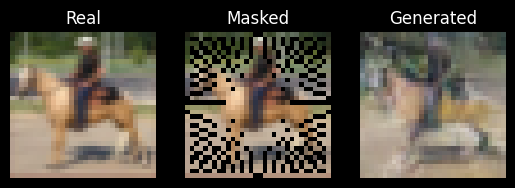

In [97]:
netG.eval()

with torch.no_grad():
    for i, (real_images, _) in enumerate(loader['test']):

        real_images = real_images.to(device)
        batch_mask = torch.from_numpy(
            np.repeat(mask[np.newaxis, :, :, np.newaxis], axis=0, repeats=len(real_images))
            ).permute(0, 3, 1, 2).float().to(device)

        noised_images = real_images * batch_mask
        denoised_images = netG(noised_images)

        reconstruction_err = mse_loss(denoised_images, real_images)

        if i % 100:
            print(f"MSE error: {reconstruction_err:.4f}")
            visualize_images(real_images, denoised_images)